# Explore Capella Public Data

Goal of this notebook is to get started with Capella Open Data (https://registry.opendata.aws/capella_opendata/) using open source Python software. Emphasis is just on understanding the data coverage and doing some basic computations and visualization of the geocoded products.

Note there is a *static* STAC catalog to explore data (but not a search API endpoint). You can also browse the collection here https://capella-open-data.s3.us-west-2.amazonaws.com/index.html or on Capellas website: https://www.capellaspace.com/gallery/

It seems these are 125 acquisitions from around the globe showcasing Capella's different imaging modes (sliding spotlight (22), spotlight (67), stripmap (36) provided in four different formats / processing levels (SLC, SICD, GEC, GEO)

*GEO Product Summary*
| imaging mode | nlooks | mid ground range resolution (m) | pixel posting |
| - | - | - | - |
| spotlight | 9 | 0.6 | 0.35 |
| sliding | 5 | 1.0 | 0.6 |
| strip | 1 | 1.3 | 0.8 |


Single-Pol HH & VV, but open catalog seems to be all HH

More docs here https://support.capellaspace.com/hc/en-us/articles/360045064012-API-Reference-and-Documentation 

In [1]:
import geopandas as gpd
import hvplot.pandas
import hvplot.xarray
import httpx
import json
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import pystac
import rasterio
import rasterio.plot
import rioxarray
import stackstac
import urllib.request

from folium import Map, TileLayer

%config InlineBackend.figure_format = 'retina'

## Convert to GeoJSON FeatureCollection

While the STAC catalog is great, it is a bunch of separately hosted JSON files. Here we'll flatten it into a single GeoJSON FeatureCollection to open and explore with GeoPandas. 

As always, there is a bit of metadata 'cleaning' and reorganization for subsequent analysis :) 

In [2]:
static_stac = 'https://capella-open-data.s3.us-west-2.amazonaws.com/stac/catalog.json'
cat = pystac.read_file(static_stac)

In [3]:
[x for x in cat.get_children()]

[<Catalog id=capella-open-data-by-product-type>,
 <Catalog id=capella-open-data-by-instrument-mode>,
 <Catalog id=capella-open-data-by-datetime>]

In [4]:
# Save everything as single geojson file

if not os.path.isfile('capella-open-data.geojson'):
    # Each subcatalog references the same items, so just pick 1 to avoid duplicates
    subcat = cat.get_child('capella-open-data-by-datetime')

    item_list = list(subcat.get_all_items())
    print(len(item_list))

    # Geopandas ignores list-valued keys when opening, so this moves asset hrefs to properties for convenience
    for item in item_list:
        item.clear_links()
        asset_hrefs = pd.DataFrame(item.to_dict()['assets']).T['href'].to_dict()
        item.properties.update(asset_hrefs)

    items = pystac.ItemCollection(item_list)
    items.save_object('capella-open-data.geojson') 

In [5]:
# Pystac can also open and explore this catalog interactively
items = pystac.ItemCollection.from_file('capella-open-data.geojson')
item = items[0]

# Nice interactive HTML display with PySTAC >= 1.5
item

<Item id=CAPELLA_C02_SP_SICD_HH_20201201165028_20201201165030>

## Explore with GeoPandas

In [6]:
gf = gpd.read_file('capella-open-data.geojson')

In [7]:
gf.head(2)

,id,sar:frequency_band,datetime,start_datetime,end_datetime,platform,constellation,sar:instrument_mode,sar:center_frequency,sat:orbit_state,...,capella:orbital_plane,sar:observation_direction,capella:collect_id,capella:product_category,capella:archive_holdback_date,HH,metadata,preview,thumbnail,geometry
0,CAPELLA_C02_SP_SICD_HH_20201201165028_20201201...,X,2020-12-01 16:50:29.384000+00:00,2020-12-01 16:50:28.109000+00:00,2020-12-01 16:50:30.659000+00:00,capella-2,capella,spotlight,9.65,descending,...,45,right,84a0652c-6bf7-45a8-b40d-54eec20730d9,standard,none,https://capella-open-data.s3.amazonaws.com/dat...,None,https://capella-open-data.s3.amazonaws.com/dat...,https://capella-open-data.s3.amazonaws.com/dat...,"POLYGON ((38.77600 14.17702, 38.74291 14.14472..."
1,CAPELLA_C02_SP_SLC_HH_20201201165028_202012011...,X,2020-12-01 16:50:29.384000+00:00,2020-12-01 16:50:28.109000+00:00,2020-12-01 16:50:30.659000+00:00,capella-2,capella,spotlight,9.65,descending,...,45,right,84a0652c-6bf7-45a8-b40d-54eec20730d9,standard,none,https://capella-open-data.s3.amazonaws.com/dat...,https://capella-open-data.s3.amazonaws.com/dat...,https://capella-open-data.s3.amazonaws.com/dat...,https://capella-open-data.s3.amazonaws.com/dat...,"POLYGON ((38.77600 14.17702, 38.74291 14.14472..."


In [8]:
with pd.option_context('display.max_colwidth', -1):
    print(gf.iloc[0])

id                                 CAPELLA_C02_SP_SICD_HH_20201201165028_20201201165030                                                                                                                         
sar:frequency_band                 X                                                                                                                                                                            
datetime                           2020-12-01 16:50:29.384000+00:00                                                                                                                                             
start_datetime                     2020-12-01 16:50:28.109000+00:00                                                                                                                                             
end_datetime                       2020-12-01 16:50:30.659000+00:00                                                                                                 

In [9]:
# Check actually ordered by datetime
gf.datetime.is_monotonic

False

In [10]:
gf.datetime.tail()

495   2022-04-21 06:45:10.111000+00:00
496   2022-04-07 11:45:09.249000+00:00
497   2022-04-07 11:45:09.249000+00:00
498   2022-04-07 11:45:09.248000+00:00
499   2022-04-07 11:45:09.248000+00:00
Name: datetime, dtype: datetime64[ns, UTC]

☝️ There is a small issue with the STAC sorting of datetime, notice that `2022-04-07` comes *after* `04-21` , I think this is because `7` is interpreted of being the first digit, and `7>2`!

In [11]:
# Sort it out
gf = gf.sort_values('datetime').reset_index(drop=True)
gf.datetime.is_monotonic

True

In [12]:
gf.groupby('sar:product_type')['id'].count()

sar:product_type
GEC     125
GEO     125
SICD    125
SLC     125
Name: id, dtype: int64

In [13]:
# 125 acquitions in public data catalog, each provided in 4 different formats (GEO, GEC, SICD, SLC)
gf['capella:collect_id'].nunique() 

125

In [14]:
# Reduce to single product-type per collect 
# Need backticks b/c of : special character
unique_collects = gf.query('`sar:product_type` == "SLC"')

In [15]:
unique_collects.groupby('sar:instrument_mode')['id'].count()

sar:instrument_mode
sliding_spotlight    22
spotlight            67
stripmap             36
Name: id, dtype: int64

In [16]:
unique_collects.groupby('platform')['id'].count()

platform
capella-2    46
capella-3    45
capella-5    20
capella-6    14
Name: id, dtype: int64

In [17]:
unique_collects.groupby('sar:observation_direction')['id'].count()

sar:observation_direction
left     68
right    57
Name: id, dtype: int64

In [18]:
#gf.explore() # TypeError: Object of type Timestamp is not JSON serializable
# For plotting
gfplot = unique_collects.copy()
gfplot['datetime'] = unique_collects['datetime'].astype(str)
gfplot['start_datetime'] = unique_collects['start_datetime'].astype(str)
gfplot['end_datetime'] = unique_collects['end_datetime'].astype(str)

In [19]:
gfplot.explore(popup=True, 
               column='sar:instrument_mode', 
               #column='platform', #see which can get polar regions (capella3 & 5)
               cmap='rainbow',
               tiles="CartoDB dark_matter",
              )

## Hone in on repeat spotlight acquisitions in Eugene, Oregon, USA

### Filter by bounding box

In [20]:
# oregon
xmin = -125
xmax = -121
ymin = 42
ymax = 46
subset = gf.cx[xmin:xmax,ymin:ymax] # intersection w/ bounding box
len(subset)

36

In [21]:
# Separate out products
slc = subset.query('`sar:product_type` == "SLC"').reset_index()
geo = subset.query('`sar:product_type` == "GEO"').reset_index()
gec = subset.query('`sar:product_type` == "GEC"').reset_index()
len(slc)

9

In [22]:
# time separation between acquisitions
geo['dt'] = geo.datetime.diff()
geo[['datetime','dt']]

,datetime,dt
0,2022-01-12 17:48:23.356000+00:00,NaT
1,2022-02-10 05:43:37.496000+00:00,28 days 11:55:14.140000
2,2022-02-26 09:32:54.003000+00:00,16 days 03:49:16.507000
3,2022-03-12 19:53:33.943000+00:00,14 days 10:20:39.940000
4,2022-03-24 16:40:34.453000+00:00,11 days 20:47:00.510000
5,2022-03-29 15:02:46.017000+00:00,4 days 22:22:11.564000
6,2022-04-07 11:45:09.248000+00:00,8 days 20:42:23.231000
7,2022-04-15 03:23:35.111000+00:00,7 days 15:38:25.863000
8,2022-04-21 06:45:10.111000+00:00,6 days 03:21:35


In [23]:
# Quick timeline of acquisitions
img = geo.hvplot.scatter(x='datetime',y='platform')
img

:Scatter   [datetime]   (platform)

In [24]:
columns = ['id','platform','capella:collect_id','geometry']
geo.loc[:,columns].explore(column='platform',
                           cmap='rainbow',
                           style_kwds=dict(fill=False),
                           # https://xyzservices.readthedocs.io/en/stable/introduction.html#what-is-this-provider-object
                           #tiles="CartoDB dark_matter", 
                           tiles="Esri.WorldImagery", 
                            )
# Prominent buildings are University of Oregon sports complexes (Hayward Field and Matthew Knight Arena)

In [25]:
# Save this subset to a FeatureCollection for later (could convert timedelta dytpe to keep)...
geo.drop(columns='dt', inplace=True) #ValueError: Invalid field type <class 'pandas._libs.tslibs.timedeltas.Timedelta'>
geo.to_file('capella-eugene.json', driver='GeoJSON')

## Dynamic tiling

Because these are COGs and public, we can use a dynamic tiler to efficiently view the data on an interactive map. This is also a nice way to qualitatively check georeferencing against widely used layers (such as OSM streets in cities

In [26]:
titiler_endpoint = "https://titiler.xyz"
i = 0
# The 'preview' image should be good for defaults, we just get the bounds to setup the map
url = geo.preview.iloc[i]

#print(url)

r = httpx.get(
    f"{titiler_endpoint}/cog/info",
    params = {
        "url": url,
    }
).json()
bounds = r["bounds"]


r = httpx.get(
    f"{titiler_endpoint}/cog/tilejson.json",
    params = {
        "url": url,
    }
).json()

In [27]:
# Plot it! Zooming in and out will automatically update resolution
# This is very high resolution (sub-meter)!

m = Map(
    location=((bounds[1] + bounds[3]) / 2,(bounds[0] + bounds[2]) / 2),
    zoom_start=13
)

aod_layer = TileLayer(
    tiles=r["tiles"][0],
    opacity=1,
    attr="Capella Open Data"
)
aod_layer.add_to(m)
m

/srv/conda/envs/notebook/lib/python3.10/site-packages/rasterio/__init__.py:277: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


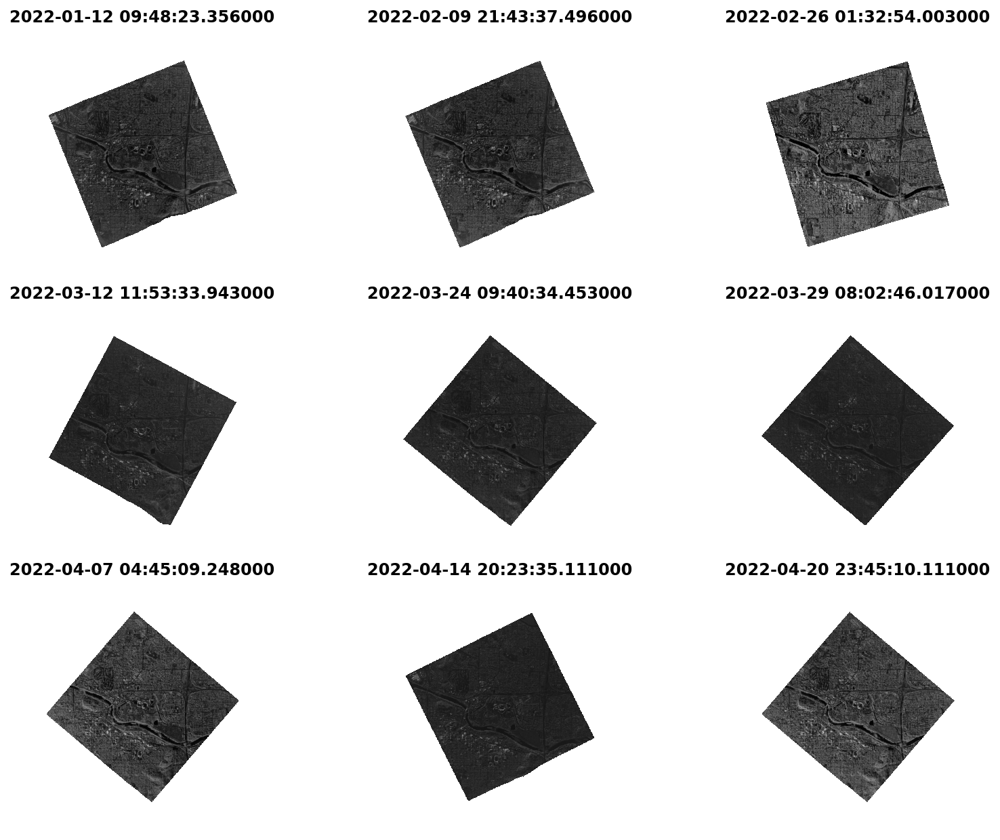

In [28]:
# Also it can be nice to make a grid of thubnails for a specific place
fig, axes = plt.subplots(3, 3, figsize=(11, 8.5), 
                         constrained_layout=True, #https://matplotlib.org/stable/tutorials/intermediate/constrainedlayout_guide.html#constrained-layout-guide
                        )

for ax,(i,row) in zip(axes.flat, geo.iterrows()):
    # Title with local timezones
    time = row.datetime.tz_convert('US/Pacific').tz_localize(None)
    #time = row.datetime.tz_localize(None) #or UTC times
    
    # Environment variables for faster Cloud access
    with rasterio.Env(GDAL_DISABLE_READDIR_ON_OPEN='EMPTY_DIR',
                      AWS_NO_SIGN_REQUEST='YES'):
        with rasterio.open(row.thumbnail) as src:
            rasterio.plot.show(src, cmap='gray',ax=ax, title=str(time))
    ax.axis('off')

☝️ NOTICE these are not only dawn/dusk local times as is common for Sun-synchronus polar orbits. Also the viewing geometry varies a lot! You have right-looking and left-looking and different incidence angles from mid-inclination orbits. It would help to rescale these images since they are all quite dark...

## Read additional metadata

In [29]:
def get_metadata_value(row, key='software_version'):
    ''' 'product_version' and many others!'''
    with urllib.request.urlopen(row.metadata) as url:
        cmeta = json.loads(url.read().decode())
        return cmeta[key]

In [30]:
geo.apply(get_metadata_value, axis=1)

0    2.13.4
1    2.17.2
2    2.18.2
3    2.19.1
4    2.21.1
5    2.21.1
6    2.21.2
7    2.22.1
8    2.22.1
dtype: object

## Analyze a single image

We'll convert from digital number (DN) to gamma0 on a decibel scale

In [31]:
i = 0
da = rioxarray.open_rasterio(geo.HH.iloc[i])
da

<xarray.DataArray (band: 1, y: 24268, x: 24413)>
[592454684 values with dtype=uint16]
Coordinates:
  * band         (band) int64 1
  * x            (x) float64 4.903e+05 4.903e+05 ... 4.988e+05 4.988e+05
  * y            (y) float64 4.882e+06 4.882e+06 ... 4.874e+06 4.874e+06
    spatial_ref  int64 0
Attributes:
    _FillValue:    0.0
    scale_factor:  1.0
    add_offset:    0.0

In [32]:
da.rio.crs #UTM

CRS.from_epsg(32610)

In [33]:
da.nbytes/1e9 #1.1GB if read into memory

1.184909368

In [34]:
# https://support.capellaspace.com/hc/en-us/articles/7124025490964-Scaling-GEO-Images-in-QGIS
# https://github.com/capellaspace/jupyter-notebooks/blob/master/TileDB/Capella-Convert-to-dB-Example-Using-API-and-TileDB.ipynb

def get_geo_scale_factor(row):
    ''' 'product_version' and many others!'''
    with urllib.request.urlopen(row.metadata) as url:
        cmeta = json.loads(url.read().decode())
        return cmeta['collect']['image']['scale_factor']

        
geo['scale_factor'] = geo.apply(get_geo_scale_factor, axis=1)

In [36]:
# Convert to dB scale for better viz!
# Warning: this promotes to float64 dtype
def watts2dB(da, scale_factor):
    return 20*np.log10(scale_factor * da) 

In [37]:
da_dB = watts2dB(da, geo.scale_factor.iloc[i])

/srv/conda/envs/notebook/lib/python3.10/site-packages/xarray/core/computation.py:727: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


In [40]:
da_dB.nbytes/1e9

4.739637472

In [41]:
da_dB.sel(band=1).hvplot.image(x='x', y='y', 
                rasterize=True, 
                data_aspect=1,
                title=geo.id.iloc[i], 
                cmap='gray',
                clabel='sigma0 (dB)') 

:DynamicMap   []
   :Image   [x,y]   (value)

## Load a datacube

Each of these images has a slightly different grid, to get them all into xarray they must be aligned, and the stackstac library will do that, reprojecting data behind the scenes with rasterio if necessary.

In [44]:
items = pystac.ItemCollection.from_file('capella-open-data.geojson')

In [45]:
IDS = geo.id.to_list()
IDS

['CAPELLA_C02_SP_GEO_HH_20220112174811_20220112174835',
 'CAPELLA_C02_SP_GEO_HH_20220210054325_20220210054349',
 'CAPELLA_C05_SP_GEO_HH_20220226093242_20220226093305',
 'CAPELLA_C06_SP_GEO_HH_20220312195320_20220312195347',
 'CAPELLA_C06_SP_GEO_HH_20220324164025_20220324164043',
 'CAPELLA_C06_SP_GEO_HH_20220329150236_20220329150256',
 'CAPELLA_C06_SP_GEO_HH_20220407114459_20220407114518',
 'CAPELLA_C06_SP_GEO_HH_20220415032324_20220415032345',
 'CAPELLA_C06_SP_GEO_HH_20220421064500_20220421064519']

In [46]:
subset = pystac.ItemCollection([i for i in items if i.id in IDS])

In [47]:
# unfortunately STAC does not have proj:epsg and proj:transform this function adds that info to the metadata
from pystac.extensions.projection import ProjectionExtension

def add_proj_extension(item):
    with rasterio.Env(GDAL_DISABLE_READDIR_ON_OPEN='EMPTY_DIR',
                      AWS_NO_SIGN_REQUEST='YES'):
        
        with rasterio.open(item.assets['HH'].href) as src:
            transform = src.profile['transform']
            projection = ProjectionExtension.ext(item, add_if_missing=True)
            projection.epsg = src.crs.to_epsg()
            projection.transform = list(src.transform)
            # projection.shape = src.shape
            
[add_proj_extension(item) for item in subset]

[None, None, None, None, None, None, None, None, None]

In [48]:
# NOTE: this expands the coordinates to include all images,
# and uses Dask to use multiple threads for parallelism
# Reading the entire image stack into memory would take ~28GB
da = stackstac.stack(subset,
                     assets=['HH']
                    )

In [49]:
da

,Array,Chunk
Bytes,27.61 GiB,8.00 MiB
Shape,"(9, 1, 20236, 20344)","(1, 1, 1024, 1024)"
Count,3618 Tasks,3600 Chunks
Type,float64,numpy.ndarray


In [50]:
# Add scale factor as a coordinate:
da = da.assign_coords(scale_factor=('time', geo.scale_factor.values))

In [51]:
# Scale by scale factor
daS = da * da.coords['scale_factor']

In [52]:
# Convert to decibel scale
da_dB = 20*np.log10(daS) 

In [53]:
# Zoom into specific area of interest
northings = slice(4.877e6, 4.876e6) #decreasing 
eastings = slice(4.942e5, 4.952e5) #increasing

In [54]:
da_dB = da_dB.sel(band='HH', x=eastings, y=northings)
da_dB

<xarray.DataArray (time: 9, y: 2857, x: 2858)>
dask.array<getitem, shape=(9, 2857, 2858), dtype=float64, chunksize=(1, 1024, 1024), chunktype=numpy.ndarray>
Coordinates: (12/40)
  * time                             (time) datetime64[ns] 2022-01-12T17:48:2...
    id                               (time) <U51 'CAPELLA_C02_SP_GEO_HH_20220...
    band                             <U2 'HH'
  * x                                (x) float64 4.942e+05 ... 4.952e+05
  * y                                (y) float64 4.877e+06 ... 4.876e+06
    platform                         (time) <U9 'capella-2' ... 'capella-6'
    ...                               ...
    sar:looks_azimuth                int64 9
    end_datetime                     (time) <U27 '2022-01-12T17:48:35.266093Z...
    title                            <U9 'Data file'
    polarization                     <U2 'HH'
    epsg                             int64 32610
    scale_factor                     (time) float64 0.0008207 ... 0.001007

In [55]:
%%time
# Pull all values to local RAM, then visualize
da_dB = da_dB.compute()

CPU times: user 8.71 s, sys: 1.31 s, total: 10 s
Wall time: 10.3 s


In [56]:
da_dB.hvplot.image(x='x', y='y', 
                rasterize=True, 
                data_aspect=1,
                cmap='gray',
                clim=(-10,20), # same colorbar for all
                widget_location='bottom',
                clabel='sigma0 (dB)') 

Column
    [0] HoloViews(DynamicMap, widget_location='bottom')
    [1] Row
        [0] HSpacer()
        [1] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='time', options=OrderedDict([('2022-01-12 ...]), value=numpy.datetime64('2022-01-..., width=250)
        [2] HSpacer()